#### Import required packages  


24-nov
    - add dbscan to basic clustering ...




<a name='toc'></a>  TOC

* <a href='#me.01.t1'> Modeling and Evaluation 1</a> :
            Train and adjust parameters  
            
  - <a href='#k-means'>K-Means</a>
  - <a href='#end_of_file'> end of file</a>


In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#%matplotlib inline
import warnings
warnings.simplefilter('ignore',DeprecationWarning)
import seaborn as sns
import time
import copy

from pylab import rcParams
#import hdbscan

from sklearn.model_selection import ShuffleSplit
from sklearn.preprocessing import StandardScaler

#from sklearn.datasets import make_blobs

from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score

from sklearn import metrics
from sklearn import metrics as mt
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import confusion_matrix as conf
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support as score

from sklearn.cluster import KMeans

from tabulate import tabulate

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from __future__ import print_function

#### Read in cleaned  dataset from .csv file  

In [42]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in cleaned data set
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 'mashable_clean_dataset_for_lab_03.csv'

file_2_read = data_dir + data_file
df = pd.read_csv(file_2_read)

df_cluster = copy.deepcopy(df)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... add 'popular' binary based 'shares' values
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_cluster['shares'] = np.exp(df_cluster['ln_shares'])
df_cluster['popular'] = np.where(df_cluster['shares'] > 1400, 1, 0)

df_cluster.head()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... read in t-SNE vectors
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

data_dir = '../data/'
data_file = 't_sne_mapping_perplex_0100.csv'

file_2_read = data_dir + data_file
df_tsne = pd.read_csv(file_2_read)

df_tsne.head()

,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,...,ln_self_reference_avg_sharess,ln_LDA_00,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares
0,12,5,0,1,0,1.800304,1,0,0,0,...,6.208590,0.405686,0.320836,0.039225,0.040434,0.039339,0.013606,0.095310,0.171850,6.385194
1,9,4,0,0,0,1.800304,1,0,0,0,...,0.000000,0.587651,0.048835,0.048882,0.048886,0.048791,0.015565,0.032790,0.000000,6.566672
2,9,6,0,0,0,1.800304,1,0,0,0,...,6.823286,0.197040,0.032791,0.032807,0.032790,0.520096,0.009434,0.095310,0.000000,7.313220
3,9,7,0,1,0,1.800304,1,0,0,0,...,0.000000,0.028173,0.350164,0.401893,0.028495,0.028171,0.020504,0.127833,0.000000,7.090077
4,13,7,0,0,0,1.800304,1,0,0,0,...,8.055843,0.028231,0.028387,0.028175,0.028171,0.634154,0.012054,0.032790,0.127833,6.224558


,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,12,5,0,1,0,1.800304,1,0,0,0,...,0.320836,0.039225,0.040434,0.039339,0.013606,0.095310,0.171850,6.385194,593.0,0
1,9,4,0,0,0,1.800304,1,0,0,0,...,0.048835,0.048882,0.048886,0.048791,0.015565,0.032790,0.000000,6.566672,711.0,0
2,9,6,0,0,0,1.800304,1,0,0,0,...,0.032791,0.032807,0.032790,0.520096,0.009434,0.095310,0.000000,7.313220,1500.0,1
3,9,7,0,1,0,1.800304,1,0,0,0,...,0.350164,0.401893,0.028495,0.028171,0.020504,0.127833,0.000000,7.090077,1200.0,0
4,13,7,0,0,0,1.800304,1,0,0,0,...,0.028387,0.028175,0.028171,0.634154,0.012054,0.032790,0.127833,6.224558,505.0,0


,x-tsne,y-tsne,sample_index
0,-8.666918,-3.151437,22306
1,31.333773,-0.479445,744
2,-19.620867,-5.326455,24340
3,16.426628,22.355871,35153
4,-17.206806,5.560171,9838


In [43]:
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... join t-sne vectors with base data, since we sampled to create
# ...     the t-sne mapping
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

df_join = df_tsne.join(df_cluster, on = 'sample_index')

df_join.head()


,x-tsne,y-tsne,sample_index,n_tokens_title,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_socmed,kw_avg_max,weekday_is_monday,...,ln_LDA_01,ln_LDA_02,ln_LDA_03,ln_LDA_04,ln_global_rate_negative_words,ln_min_positive_polarity,ln_abs_title_sentiment_polarity,ln_shares,shares,popular
0,-8.666918,-3.151437,22306,10,6,0,0,0,2.017935,1,...,0.180050,0.532216,0.032796,0.032796,0.013423,0.095310,0.000000,6.562444,708.0,0
1,31.333773,-0.479445,744,9,5,0,0,0,0.210243,0,...,0.039221,0.609764,0.039221,0.039223,0.010067,0.032790,0.000000,7.824046,2500.0,1
2,-19.620867,-5.326455,24340,16,9,0,0,0,1.595056,0,...,0.021984,0.647667,0.021980,0.021998,0.017349,0.095310,0.127833,7.863267,2600.0,1
3,16.426628,22.355871,35153,8,10,0,0,0,3.690468,0,...,0.019814,0.019803,0.351030,0.019843,0.000000,0.000000,0.000000,7.600902,2000.0,1
4,-17.206806,5.560171,9838,10,8,0,0,0,1.270225,0,...,0.024694,0.024749,0.024693,0.641787,0.011775,0.182322,0.000000,6.617403,748.0,0


In [44]:

col_names = df_join.columns.values.tolist()
col_names
df_join.describe().T


['x-tsne',
 'y-tsne',
 'sample_index',
 'n_tokens_title',
 'num_keywords',
 'data_channel_is_lifestyle',
 'data_channel_is_entertainment',
 'data_channel_is_socmed',
 'kw_avg_max',
 'weekday_is_monday',
 'weekday_is_tuesday',
 'weekday_is_wednesday',
 'weekday_is_thursday',
 'weekday_is_friday',
 'is_weekend',
 'global_subjectivity',
 'global_rate_positive_words',
 'rate_positive_words',
 'max_positive_polarity',
 'min_negative_polarity',
 'max_negative_polarity',
 'title_sentiment_polarity',
 'abs_title_subjectivity',
 'ln_n_tokens_content',
 'ln_num_hrefs',
 'ln_num_imgs',
 'ln_num_videos',
 'ln_kw_min_min',
 'ln_kw_avg_min',
 'ln_kw_min_max',
 'ln_kw_avg_avg',
 'ln_self_reference_avg_sharess',
 'ln_LDA_00',
 'ln_LDA_01',
 'ln_LDA_02',
 'ln_LDA_03',
 'ln_LDA_04',
 'ln_global_rate_negative_words',
 'ln_min_positive_polarity',
 'ln_abs_title_sentiment_polarity',
 'ln_shares',
 'shares',
 'popular']

,count,mean,std,min,25%,50%,75%,max
x-tsne,11893.0,0.516760,14.408213,-27.032635,-12.387447,2.780119,11.711639,34.009415
y-tsne,11893.0,-0.153049,13.459900,-28.173550,-8.650822,-0.522966,7.263571,31.130255
sample_index,11893.0,19882.864122,11489.246594,4.000000,9916.000000,19889.000000,29872.000000,39642.000000
n_tokens_title,11893.0,10.399563,2.115193,3.000000,9.000000,10.000000,12.000000,19.000000
num_keywords,11893.0,7.224081,1.907150,1.000000,6.000000,7.000000,9.000000,10.000000
data_channel_is_lifestyle,11893.0,0.052047,0.222132,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_entertainment,11893.0,0.181199,0.385199,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_socmed,11893.0,0.057092,0.232029,0.000000,0.000000,0.000000,0.000000,1.000000
kw_avg_max,11893.0,1.900997,0.996915,0.000446,1.264726,1.796301,2.431696,6.248298
weekday_is_monday,11893.0,0.166821,0.372831,0.000000,0.000000,0.000000,0.000000,1.000000


In [45]:
# set required variables for model comparison

kmeans_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

i_index = []
i_index = 0

# preparation for cross validation and model comparison, each classifier is appended once model is fit

models = []

<a href='#toc'> Table of Contents</a>

<a name='k-means'></a>
<font color="blue" size=3>K-Means

### K-Means  



n_lda =  2


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=2, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  2647347.5101
silhouette =  0.422373092998
0 -11.3838888829 7.96839016106 0
1 10.041241686 -6.65290483282 1


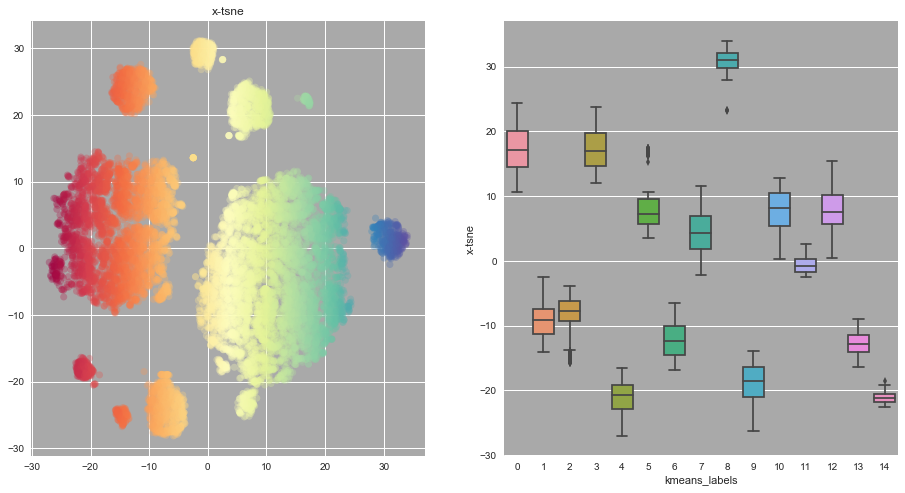

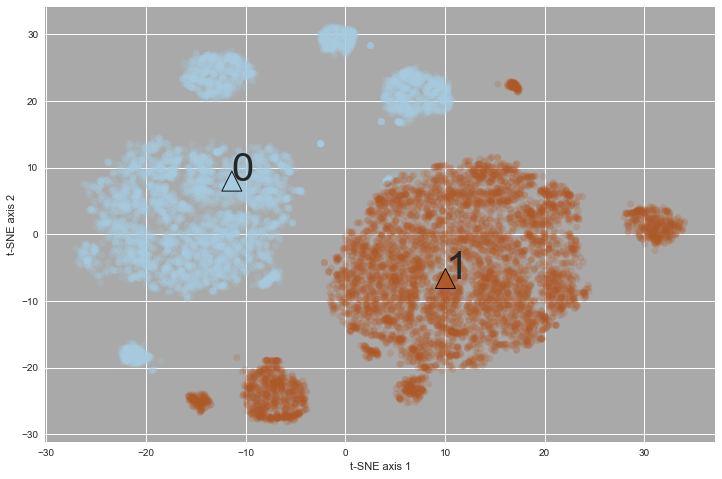

n_lda =  3


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=3, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  1711452.0526
silhouette =  0.441623823494
0 -14.3768242032 -4.16972216133 0
1 12.6618492814 -4.59135624126 1
2 -1.78914436507 21.8030230175 2


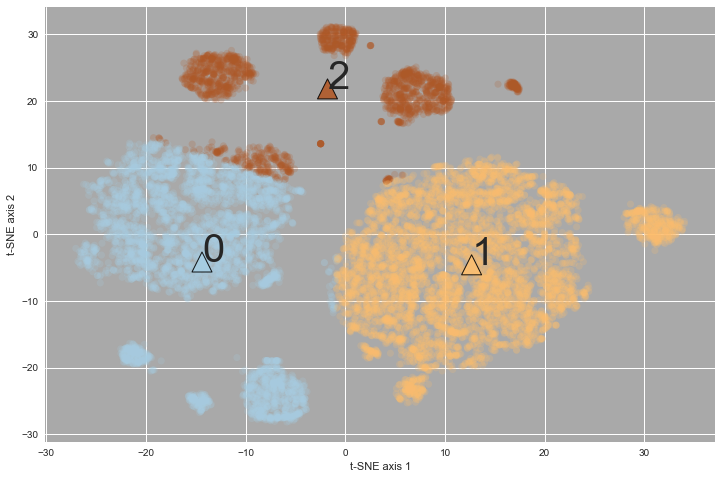

n_lda =  4


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  1146964.4981
silhouette =  0.464436070115
0 -15.1395830784 2.5390630489 0
1 -3.81303588613 -19.5044673814 1
2 -0.852218797271 23.4869915885 2
3 13.9919854747 -2.56925152262 3


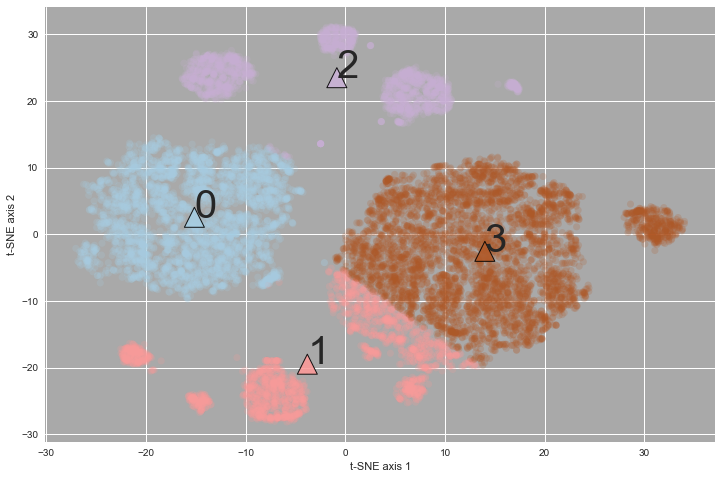

n_lda =  5


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  865598.93327
silhouette =  0.450563578179
0 -15.1404444848 2.53429319143 0
1 8.71532554705 -10.5541169269 1
2 16.8356478431 2.11110170426 2
3 -0.852218797271 23.4869915885 3
4 -11.0144744186 -22.965836504 4


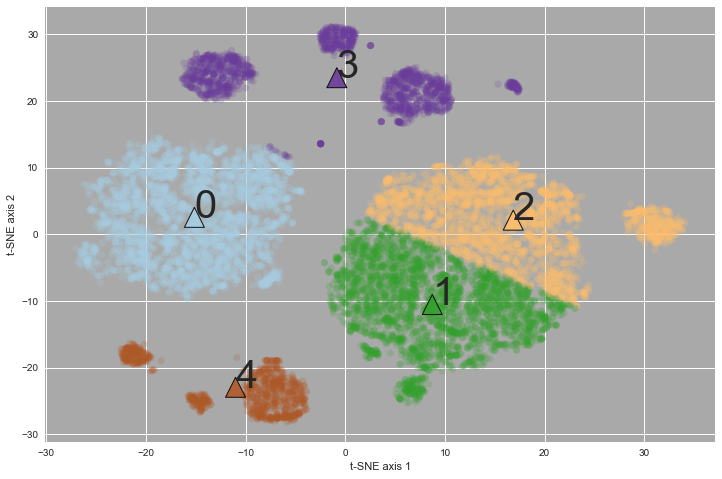

n_lda =  6


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=6, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  730136.285332
silhouette =  0.44348961335
0 -11.0144744186 -22.965836504 0
1 8.27456703097 -10.0296863306 1
2 -15.1128084769 2.56435384255 2
3 8.75499923667 14.0749891675 3
4 20.59310952 -0.172593363193 4
5 -8.69876390378 25.7699050075 5


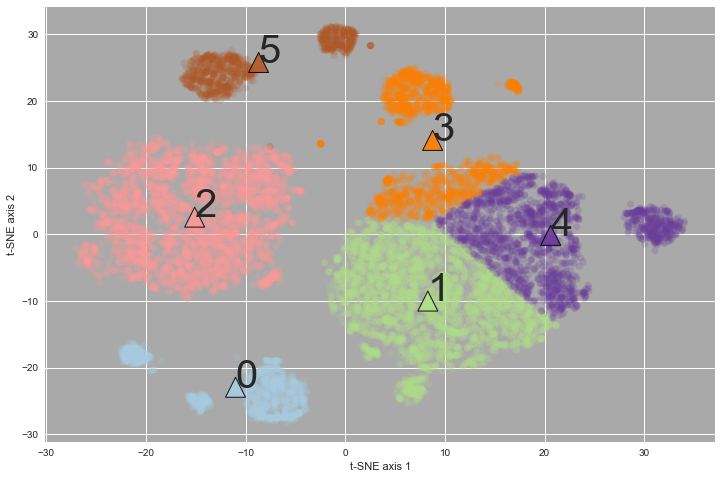

n_lda =  7


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  596180.136586
silhouette =  0.421442766219
0 -15.5780715712 0.251632608996 0
1 8.99046454417 -12.0208966109 1
2 5.83310035044 23.4400291551 2
3 -11.0144744186 -22.965836504 3
4 -13.0905869195 16.2053287618 4
5 23.1713916518 -1.01107650177 5
6 9.56558605111 2.78631011186 6


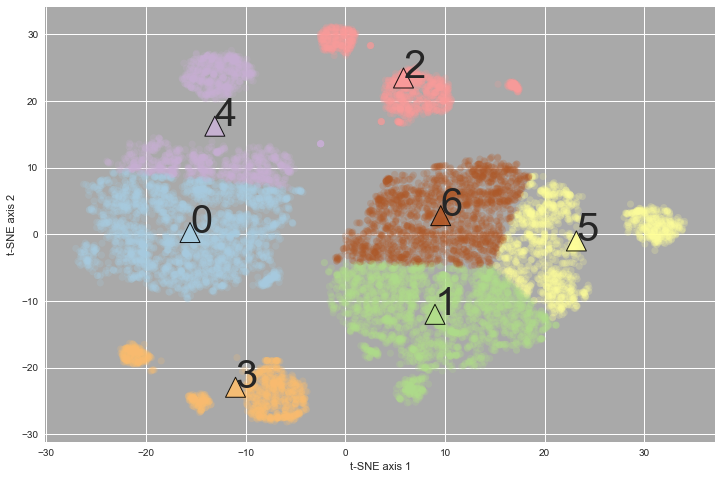

n_lda =  8


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=8, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  501711.818274
silhouette =  0.430855068143
0 9.46921797932 2.67680756135 0
1 -12.7704503597 24.0578521033 1
2 -11.0144744186 -22.965836504 2
3 9.03456518599 -12.0962716437 3
4 -14.2306106104 7.66179367188 4
5 -16.0382123673 -2.82184418206 5
6 23.135437227 -0.952245996902 6
7 5.72485079839 23.3115437113 7


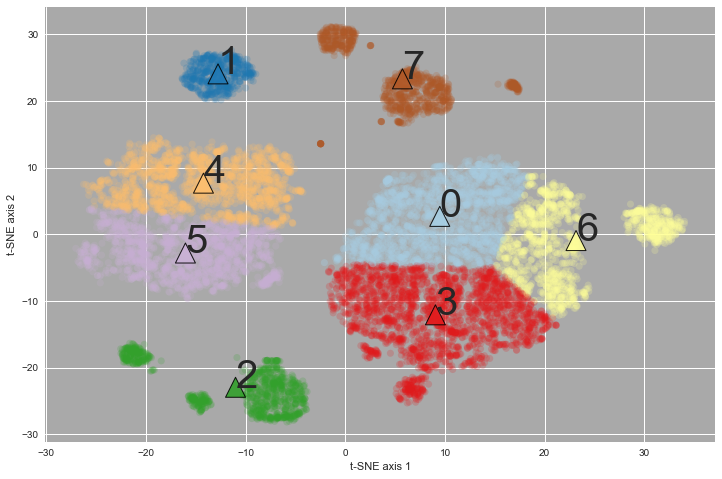

n_lda =  9


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=9, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  429069.252634
silhouette =  0.431597320651
0 -14.2909686941 7.67776556574 0
1 16.8951741967 -9.49360118563 1
2 -11.0144744186 -22.965836504 2
3 -12.7704503597 24.0578521033 3
4 -15.9722996321 -2.82634383632 4
5 5.72485079839 23.3115437113 5
6 5.74008739428 -12.1140384722 6
7 24.7533671179 2.10137512254 7
8 9.69619577441 3.09461439696 8


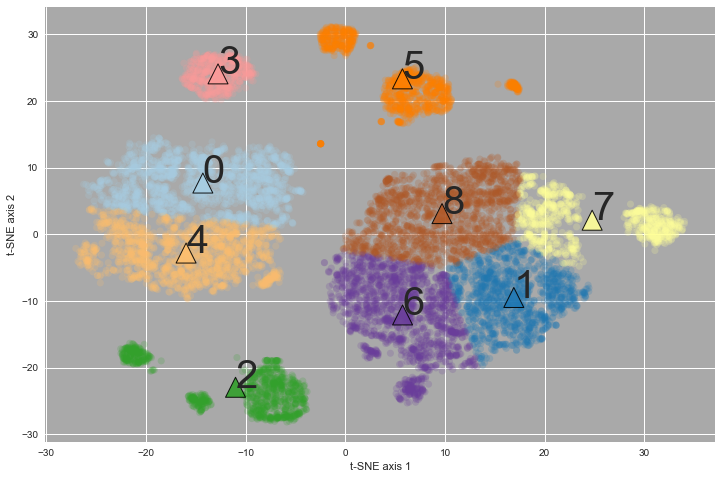

n_lda =  10


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  374413.081342
silhouette =  0.434544696351
0 -16.0154643014 -2.84821563271 0
1 7.59461152639 -16.5096635574 1
2 25.5664705202 1.86331036587 2
3 -12.7704503597 24.0578521033 3
4 11.5595291024 4.71917386257 4
5 -11.0144744186 -22.965836504 5
6 5.72485079839 23.3115437113 6
7 -14.2589506345 7.64570163706 7
8 16.9833130486 -9.04697541222 8
9 4.52838517295 -5.51954909414 9


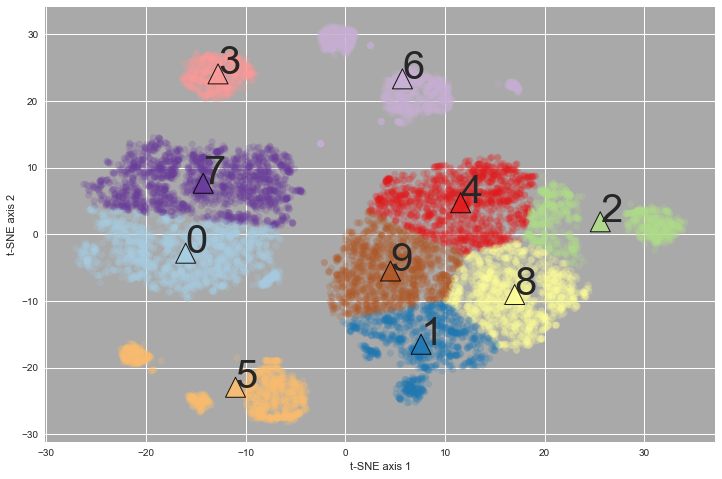

n_lda =  11


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=11, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  329587.90437
silhouette =  0.441969032629
0 25.5638285782 1.87135976044 0
1 -14.6878862745 -3.58218985541 1
2 -12.7704503597 24.0578521033 2
3 11.5074679478 4.68763720944 3
4 -20.621046034 5.5475036993 4
5 -11.0144744186 -22.965836504 5
6 5.83310035044 23.4400291551 6
7 17.0140924888 -9.0214916963 7
8 4.52664592254 -5.63465298885 8
9 -10.300802956 7.52937015572 9
10 7.66289812355 -16.5531205681 10


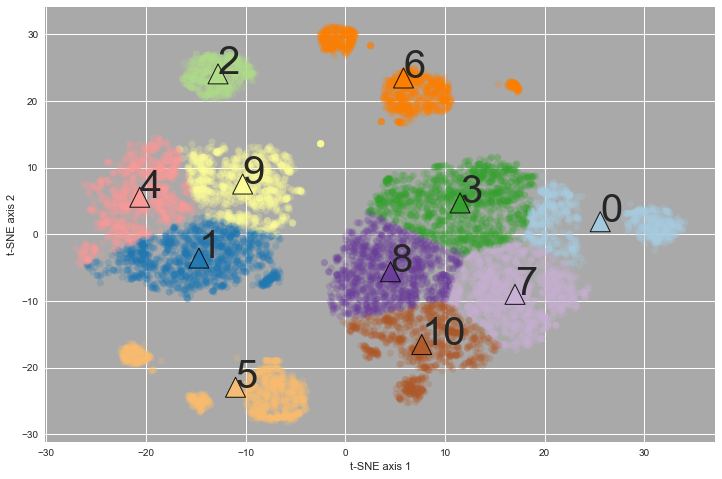

n_lda =  12


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=12, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  295224.481172
silhouette =  0.452084577099
0 -12.7704503597 24.0578521033 0
1 16.9918758439 -9.04621230139 1
2 -8.35551739633 -24.2321915655 2
3 -10.2987926585 7.51695689478 3
4 11.7005838572 4.72671553945 4
5 -20.6198762766 5.55456498058 5
6 7.57927879464 -16.4714194484 6
7 5.83310035044 23.4400291551 7
8 25.7286702925 1.83830259139 8
9 -21.1014352326 -18.1618198255 9
10 4.54216215163 -5.43003100444 10
11 -14.7012004334 -3.58709178542 11


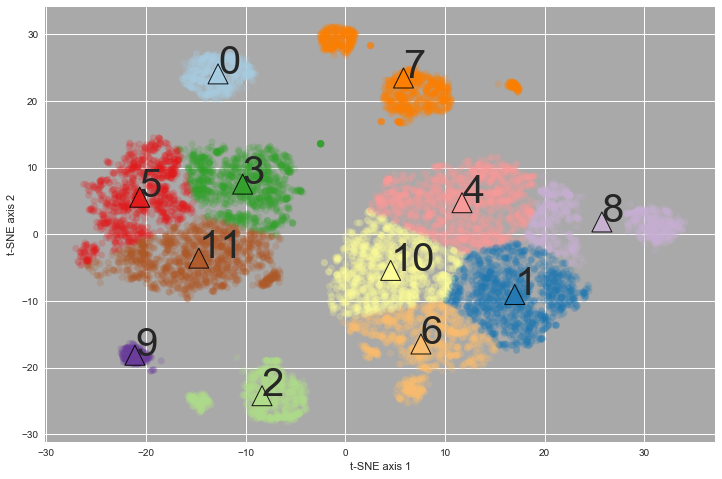

n_lda =  13


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=13, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  263978.727503
silhouette =  0.462602038466
0 16.9987253915 -9.04816994223 0
1 -15.5338904899 -3.53521588438 1
2 8.3568841712 21.185848306 2
3 4.54120339297 -5.5692092466 3
4 -19.943786588 6.6873489572 4
5 25.5579262013 1.86519143677 5
6 -8.35551739633 -24.2321915655 6
7 -0.659057356851 29.2386627197 7
8 7.6195301513 -16.5408033179 8
9 -9.95454966322 7.17632566163 9
10 -21.1014352326 -18.1618198255 10
11 -12.7704503597 24.0578521033 11
12 11.5419444232 4.71794605924 12


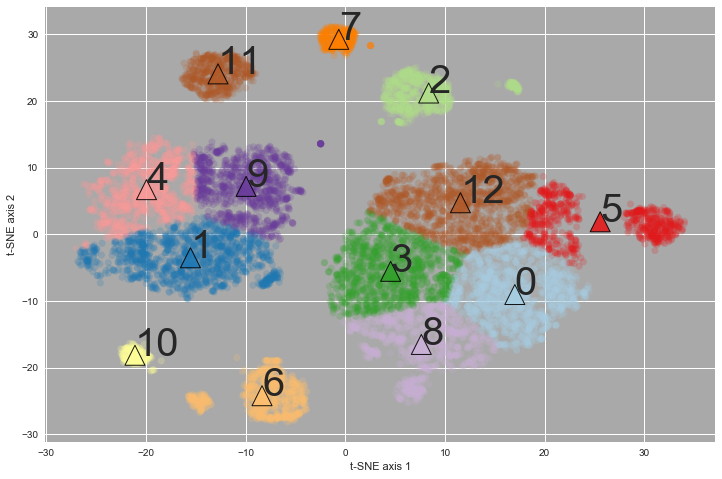

n_lda =  14


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=14, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  233054.447271
silhouette =  0.466455170471
0 -10.1811817736 7.38889142257 0
1 4.5288956734 -6.69422190077 1
2 30.8566486016 1.35617381079 2
3 -15.1212107321 -3.57342503499 3
4 7.90772187429 3.41595049602 4
5 -8.35551739633 -24.2321915655 5
6 17.1941836826 -9.31964404916 6
7 -0.659057356851 29.2386627197 7
8 -12.7704503597 24.0578521033 8
9 -20.3656327736 6.09189968363 9
10 17.2583154025 3.8814766444 10
11 8.3568841712 21.185848306 11
12 7.69006409275 -16.852201514 12
13 -21.1014352326 -18.1618198255 13


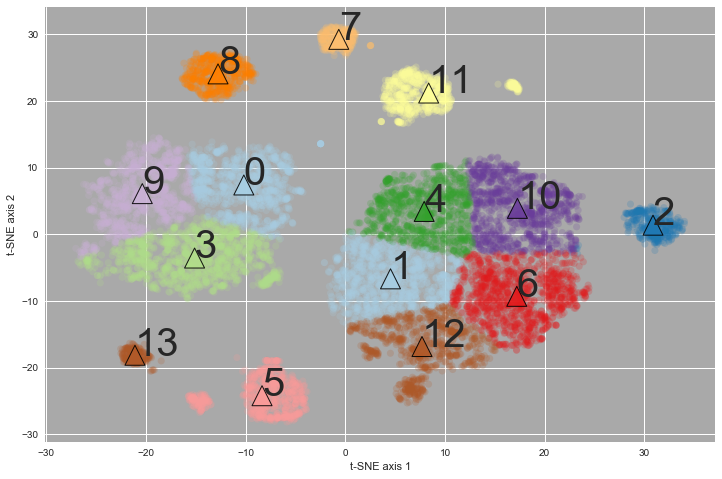

n_lda =  15


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=15, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  205604.762459
silhouette =  0.47015656918
0 17.2110556877 -9.17015987369 0
1 -9.2645323356 7.65403204319 1
2 -8.35551739633 -24.2321915655 2
3 17.2134516556 4.01609921569 3
4 -21.0341945105 -2.30859973241 4
5 8.3568841712 21.185848306 5
6 -12.1646002666 -3.17366227108 6
7 4.51075108798 -6.72263396295 7
8 30.8366886588 1.3470702027 8
9 -18.7146080131 7.83813555587 9
10 7.85587746295 3.36666985025 10
11 -0.659057356851 29.2386627197 11
12 7.76346461792 -16.8386134066 12
13 -12.7704503597 24.0578521033 13
14 -21.1014352326 -18.1618198255 14


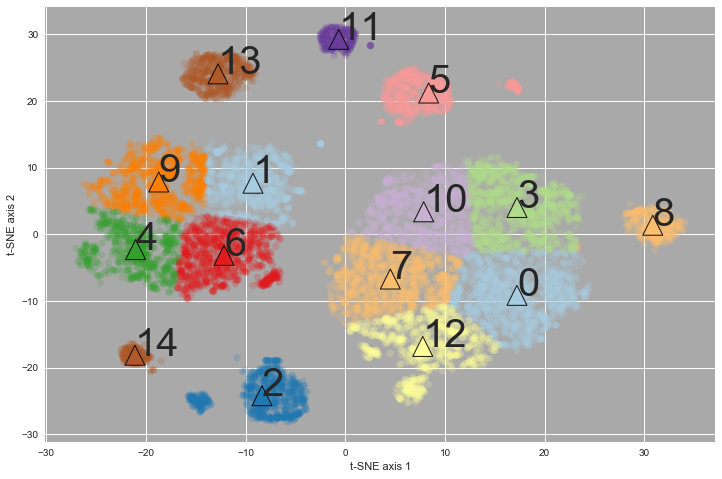

n_lda =  16


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=16, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  188436.598457
silhouette =  0.464143996789
0 4.33856507116 -6.77727690574 0
1 -9.72290244864 8.02205499639 1
2 16.8960332011 5.89296473586 2
3 -20.7540015489 -2.61204624967 3
4 8.3568841712 21.185848306 4
5 7.20503971438 3.64424662598 5
6 -8.35551739633 -24.2321915655 6
7 17.3292950774 -10.7555366861 7
8 -0.659057356851 29.2386627197 8
9 16.0449720056 -2.70524351701 9
10 7.50568219418 -16.8883079744 10
11 -12.7704503597 24.0578521033 11
12 -19.2204010657 7.62842056129 12
13 -11.899412125 -2.8964878793 13
14 30.8959002937 1.39473898683 14
15 -21.1014352326 -18.1618198255 15


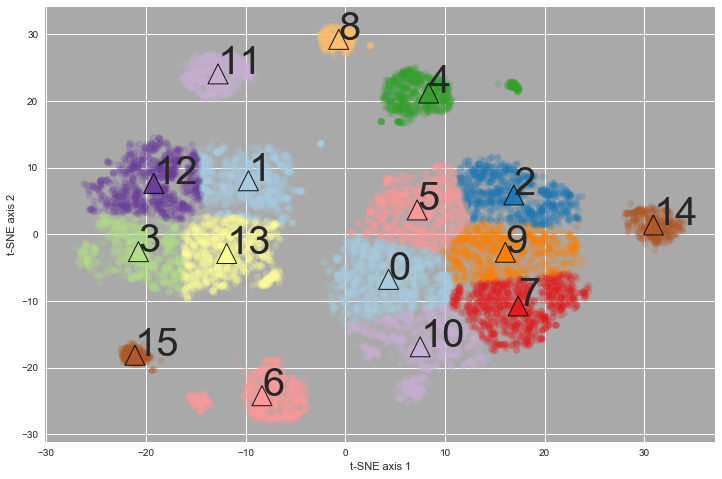

n_lda =  17


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=17, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  173910.980943
silhouette =  0.465913090042
0 -20.8140890725 -2.56349352896 0
1 8.3568841712 21.185848306 1
2 18.703867652 -10.717681453 2
3 -8.35551739633 -24.2321915655 3
4 3.27757351491 -7.6843741939 4
5 13.6026433228 7.04610647334 5
6 19.0414152199 1.24519049847 6
7 -0.659057356851 29.2386627197 7
8 30.9351422206 1.39341478047 8
9 -9.7231396516 7.98723624161 9
10 -21.1014352326 -18.1618198255 10
11 -12.7704503597 24.0578521033 11
12 8.00875700047 -17.5789239145 12
13 -11.9508315463 -2.95548552599 13
14 12.0522781702 -7.02702818611 14
15 6.26439766025 2.2073270692 15
16 -19.2152713352 7.63272443636 16


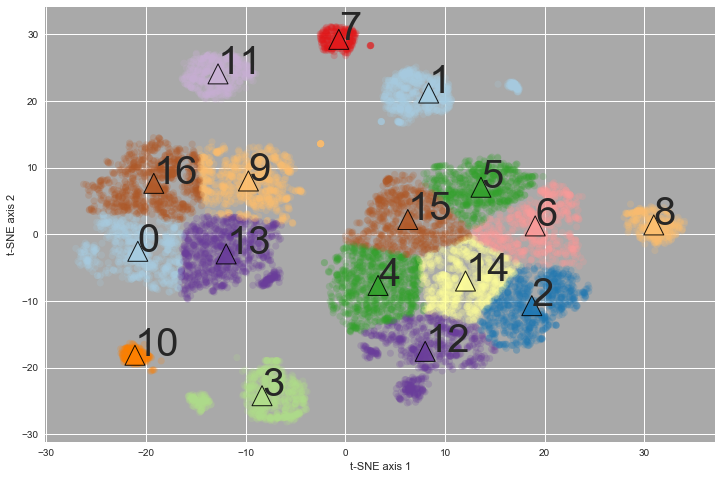

n_lda =  18


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=18, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  162495.985844
silhouette =  0.466208040756
0 3.42472168634 -7.845660142 0
1 8.3568841712 21.185848306 1
2 -18.7146080131 7.83813555587 2
3 12.0758316163 -12.0656970291 3
4 -8.35551739633 -24.2321915655 4
5 -12.7704503597 24.0578521033 5
6 20.0838971431 2.15485086172 6
7 -9.2645323356 7.65403204319 7
8 13.5269275094 7.02940213716 8
9 -12.1739670659 -3.17714189532 9
10 30.9351422206 1.39341478047 10
11 5.52064667708 2.4723538009 11
12 7.04713347012 -18.862187085 12
13 -21.1014352326 -18.1618198255 13
14 12.8455212276 -3.09678119223 14
15 -0.659057356851 29.2386627197 15
16 -21.0461161369 -2.30126045154 16
17 19.3731564139 -9.77811349001 17


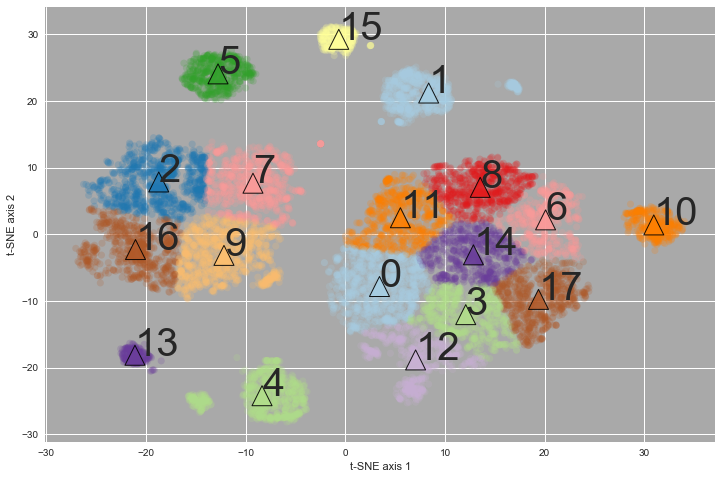

n_lda =  19


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=19, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  153492.388797
silhouette =  0.461013636206
0 19.3731564139 -9.77811349001 0
1 -9.32454505531 8.4662646616 1
2 -8.35551739633 -24.2321915655 2
3 12.8806026051 -3.09095438741 3
4 -21.335824085 -1.95338996701 4
5 -0.659057356851 29.2386627197 5
6 -13.117808582 -5.59005582904 6
7 7.04713347012 -18.862187085 7
8 -12.7704503597 24.0578521033 8
9 12.0673490386 -12.0664682165 9
10 8.3568841712 21.185848306 10
11 13.5479169027 7.03902337385 11
12 -18.7852664102 7.85436167347 12
13 5.55327145573 2.56554945625 13
14 -21.1014352326 -18.1618198255 14
15 30.9351422206 1.39341478047 15
16 3.44845005796 -7.76540971806 16
17 20.0843670599 2.1427097459 17
18 -11.2585133882 0.178381307329 18


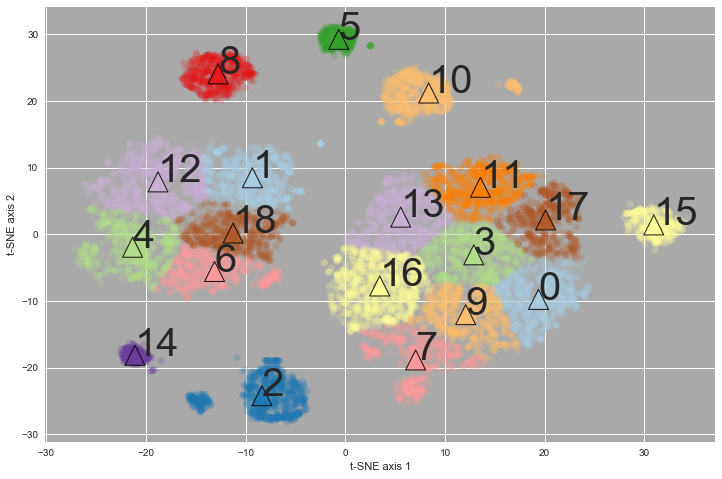

n_lda =  20


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=20, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  143078.589441
silhouette =  0.454993913697
0 -8.35551739633 -24.2321915655 0
1 6.39007583046 3.99845213061 1
2 -20.8831734707 4.51155145511 2
3 8.3568841712 21.185848306 3
4 19.5961293974 -9.30994556598 4
5 30.9351422206 1.39341478047 5
6 -12.7704503597 24.0578521033 6
7 20.0975639519 2.12382232632 7
8 -11.4633480098 -2.53048997788 8
9 13.9120422073 7.11911411514 9
10 -8.70966774795 7.78171466336 10
11 12.9471502188 -12.5278857712 11
12 3.68705711318 -4.13942918851 12
13 -0.659057356851 29.2386627197 13
14 -21.1014352326 -18.1618198255 14
15 12.8675317809 -3.23130390463 15
16 7.30717872987 -19.3794546005 16
17 3.85978175028 -11.0106948366 17
18 -19.8616371182 -3.71299423788 18
19 -16.7304268085 9.80181136015 19


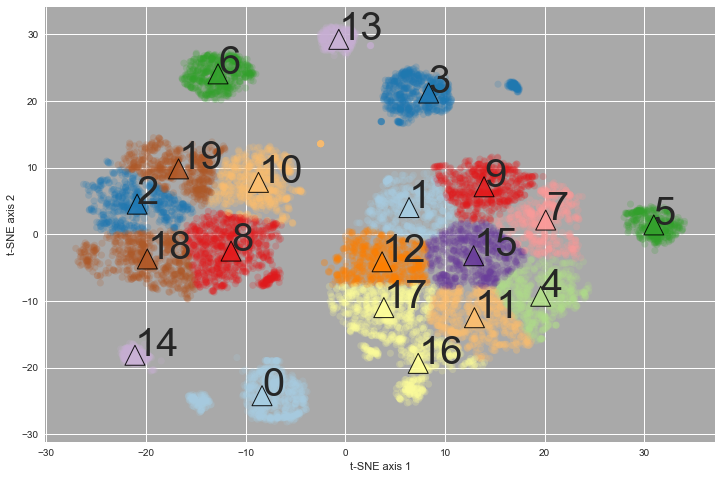

In [46]:
# ... k-means on the t-sne vectors

X_tsne = pd.DataFrame(columns=['t1', 't2'])
X_tsne['t1'] = df_join['x-tsne']
X_tsne['t2'] = df_join['y-tsne']

for n_lda in range(2, 21):  

    tic = time.clock()
    
    print ("n_lda = ", n_lda)

    cls_lda = KMeans(n_clusters = n_lda,
                     init = 'k-means++',
                     random_state = 1);
    
    cls_lda.fit(X_tsne)

    kmeans_labels = cls_lda.labels_ # the labels from kmeans clustering
    kmeans_centers = cls_lda.cluster_centers_

    kmeans_inertia = cls_lda.inertia_
    print ("inertia = ", kmeans_inertia)
    
    kmeans_silhouette = metrics.silhouette_score(X_tsne,
                                                 kmeans_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", kmeans_silhouette)
    
    toc =  time.clock()
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

    exe_time = '{0:.4f}'.format(toc-tic)
    
    raw_data = {
    'model_name' : 'KMeans - LDA features',
    'n_clusters' : n_lda,
    'inertia': kmeans_inertia,
    'silhouette': kmeans_silhouette, 
    'process_time' : exe_time
    }

    df_tbl = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    kmeans_tbl = kmeans_tbl.append(df_tbl)

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    _ = plt.figure(figsize=(12, 8));
    _ = plt.subplot(111, facecolor = 'darkgrey');
    
    X_tsne_values = X_tsne.values;
    _ = plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1],
                c = kmeans_labels,
                cmap = plt.cm.Paired,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    _ = plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1],
                c = range(n_lda),
                cmap = plt.cm.Paired,
                s = 400,
                linewidths = 1.0,
                marker = '^',
                edgecolors = 'black',
                alpha = 0.90);
    
    for ii in range(n_lda) :                                       
        _ = plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 40)
        print(ii, kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii)
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2');
    _ = plt.grid(True);

    plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - 
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-



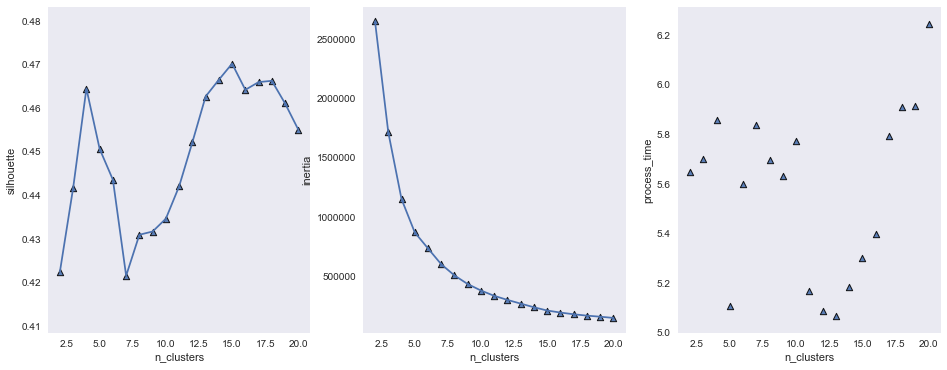

In [47]:

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - plot metrics across models for comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

plt.figure(figsize=(16, 6));

# ... silhouette values

plt.subplot(131);
plt.scatter(kmeans_tbl['n_clusters'],
            kmeans_tbl['silhouette'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(kmeans_tbl['n_clusters'],
         kmeans_tbl['silhouette'])

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
plt.grid();

# ... inertia values

plt.subplot(132);
plt.scatter(kmeans_tbl['n_clusters'],
            kmeans_tbl['inertia'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(kmeans_tbl['n_clusters'],
         kmeans_tbl['inertia'])

plt.xlabel('n_clusters'), plt.ylabel('inertia');
plt.grid();

# ... process time

plt.subplot(133);
plt.scatter(kmeans_tbl['n_clusters'],
            kmeans_tbl['process_time'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

#plt.plot(kmeans_tbl['n_clusters'],
#         kmeans_tbl['process_time'])

plt.xlabel('n_clusters'), plt.ylabel('process_time');
plt.grid();


plt.show();


### - choose kmeans clustering with preferred number of clusters  


n_lda =  4


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=4, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  1146964.4981
silhouette =  0.46588483876


0 -15.1395830784 2.5390630489 0


1 -3.81303588613 -19.5044673814 1


2 -0.852218797271 23.4869915885 2


3 13.9919854747 -2.56925152262 3
[0 3 0 ..., 1 3 2]
[[-15.13958308   2.53906305]
 [ -3.81303589 -19.50446738]
 [ -0.8522188   23.48699159]
 [ 13.99198547  -2.56925152]]


(<matplotlib.text.Text at 0x7fdaa3f30438>,
 <matplotlib.text.Text at 0x7fdab44ad0f0>)

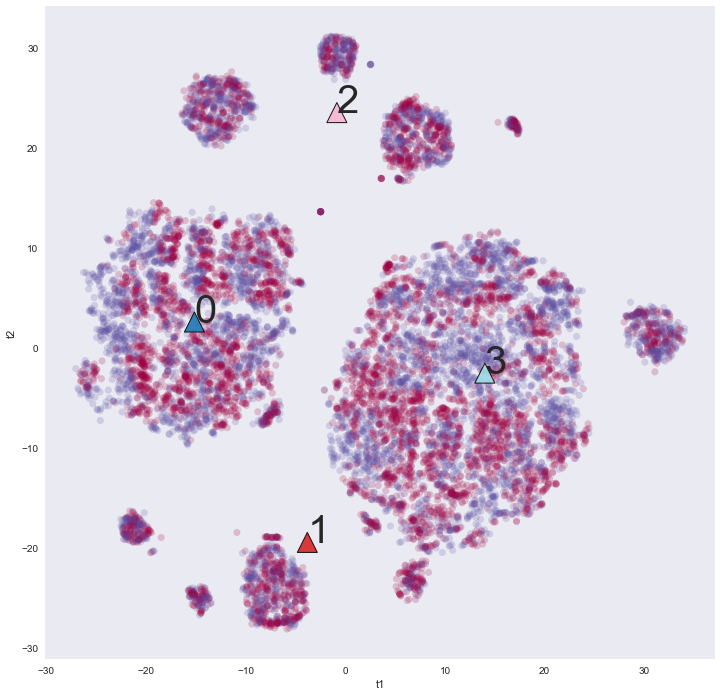

n_lda =  15


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=15, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=1, tol=0.0001, verbose=0)

inertia =  205604.762459
silhouette =  0.469358066212


0 17.2110556877 -9.17015987369 0


1 -9.2645323356 7.65403204319 1


2 -8.35551739633 -24.2321915655 2


3 17.2134516556 4.01609921569 3


4 -21.0341945105 -2.30859973241 4


5 8.3568841712 21.185848306 5


6 -12.1646002666 -3.17366227108 6


7 4.51075108798 -6.72263396295 7


8 30.8366886588 1.3470702027 8


9 -18.7146080131 7.83813555587 9


10 7.85587746295 3.36666985025 10


11 -0.659057356851 29.2386627197 11


12 7.76346461792 -16.8386134066 12


13 -12.7704503597 24.0578521033 13


14 -21.1014352326 -18.1618198255 14
[ 6  8  4 ...,  7 10 13]
[[ 17.21105569  -9.17015987]
 [ -9.26453234   7.65403204]
 [ -8.3555174  -24.23219157]
 [ 17.21345166   4.01609922]
 [-21.03419451  -2.30859973]
 [  8.35688417  21.18584831]
 [-12.16460027  -3.17366227]
 [  4.51075109  -6.72263396]
 [ 30.83668866   1.3470702 ]
 [-18.71460801   7.83813556]
 [  7.85587746   3.36666985]
 [ -0.65905736  29.23866272]
 [  7.76346462 -16.83861341]
 [-12.77045036  24.0578521 ]
 [-21.10143523 -18.16181983]]


(<matplotlib.text.Text at 0x7fdab05b4d68>,
 <matplotlib.text.Text at 0x7fdab8a3d7f0>)

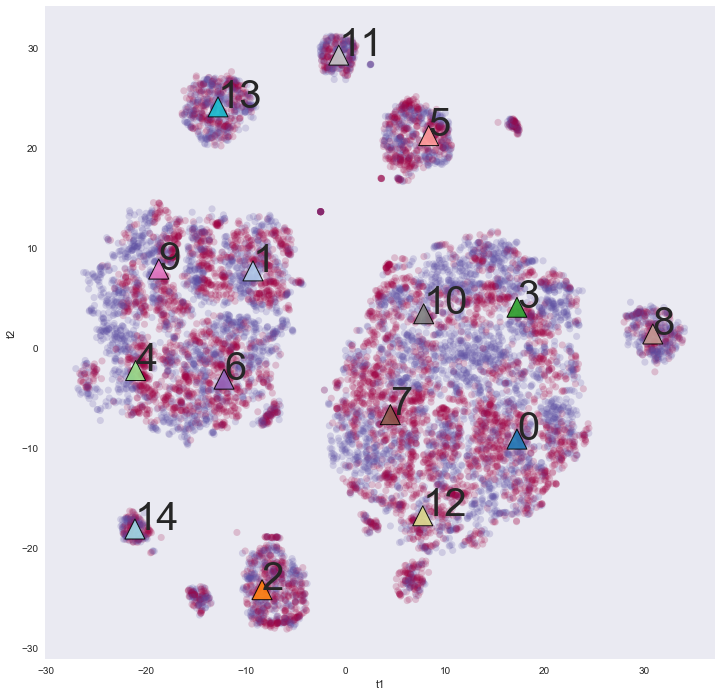

In [48]:

n_clusters_chosen = 4

for n_lda in [4, 15] :

    tic = time.clock()
    
    print ("n_lda = ", n_lda)

    cls_lda = KMeans(n_clusters = n_lda,
                     init = 'k-means++',
                     random_state = 1);
    
    cls_lda.fit(X_tsne)

    kmeans_labels = cls_lda.labels_ # the labels from kmeans clustering
    kmeans_centers = cls_lda.cluster_centers_

    kmeans_inertia = cls_lda.inertia_
    print ("inertia = ", kmeans_inertia)
    
    kmeans_silhouette = metrics.silhouette_score(X_tsne,
                                                 kmeans_labels,
                                                 metric = 'euclidean',
                                                 sample_size = 10000)
    print ("silhouette = ", kmeans_silhouette)
    
    toc =  time.clock()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    plt.figure(figsize=(12, 12));
    ax = plt.gca();
    
    X_tsne_values = X_tsne.values;
    plt.scatter(X_tsne_values[:, 0], X_tsne_values[:, 1],
                c = df_join['popular'],
                cmap = plt.cm.Spectral,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1],
                c = range(n_lda),
                cmap = plt.cm.tab20,
                s = 400,
                linewidths = 1.0,
                marker = '^',
                edgecolors = 'black',
                alpha = 0.90);    
    for ii in range(n_lda) :                                       
        plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 40)
        print(ii, kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii)

    print(kmeans_labels)
    print(kmeans_centers)
    
    
    plt.xlabel('t1'), plt.ylabel('t2');
    plt.grid();

    plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - print out comparison table
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-




In [49]:
len(kmeans_labels)


11893

In [50]:

X_all_together = copy.deepcopy(df_join)

len(X_all_together)

X_all_together['kmeans_labels'] = kmeans_labels

X_all_together.describe().T


11893

,count,mean,std,min,25%,50%,75%,max
x-tsne,11893.0,0.516760,14.408213,-27.032635,-12.387447,2.780119,11.711639,34.009415
y-tsne,11893.0,-0.153049,13.459900,-28.173550,-8.650822,-0.522966,7.263571,31.130255
sample_index,11893.0,19882.864122,11489.246594,4.000000,9916.000000,19889.000000,29872.000000,39642.000000
n_tokens_title,11893.0,10.399563,2.115193,3.000000,9.000000,10.000000,12.000000,19.000000
num_keywords,11893.0,7.224081,1.907150,1.000000,6.000000,7.000000,9.000000,10.000000
data_channel_is_lifestyle,11893.0,0.052047,0.222132,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_entertainment,11893.0,0.181199,0.385199,0.000000,0.000000,0.000000,0.000000,1.000000
data_channel_is_socmed,11893.0,0.057092,0.232029,0.000000,0.000000,0.000000,0.000000,1.000000
kw_avg_max,11893.0,1.900997,0.996915,0.000446,1.264726,1.796301,2.431696,6.248298
weekday_is_monday,11893.0,0.166821,0.372831,0.000000,0.000000,0.000000,0.000000,1.000000


In [52]:
col_names = X_all_together.columns.values.tolist()


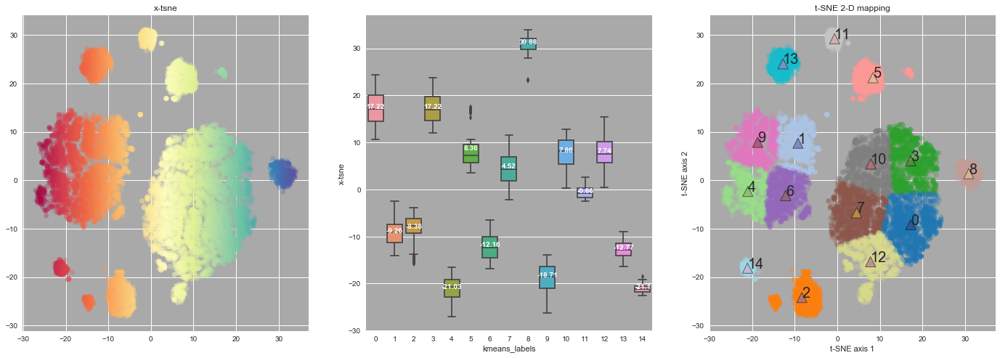

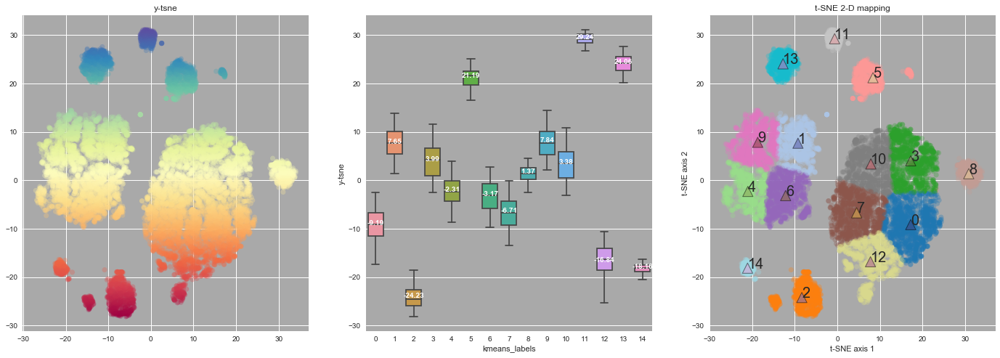

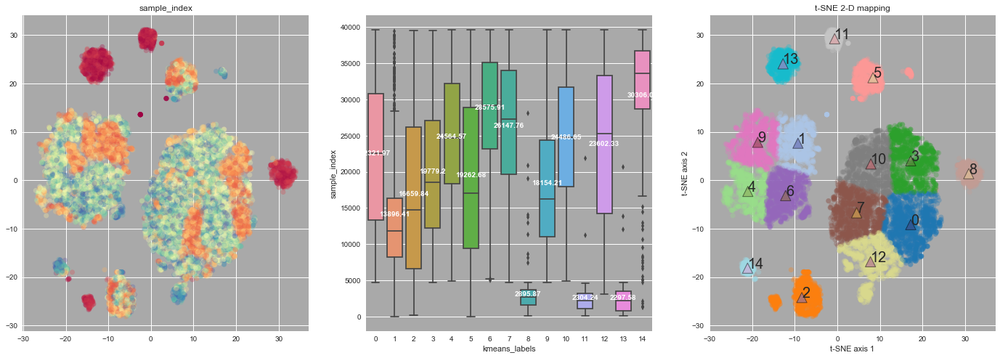

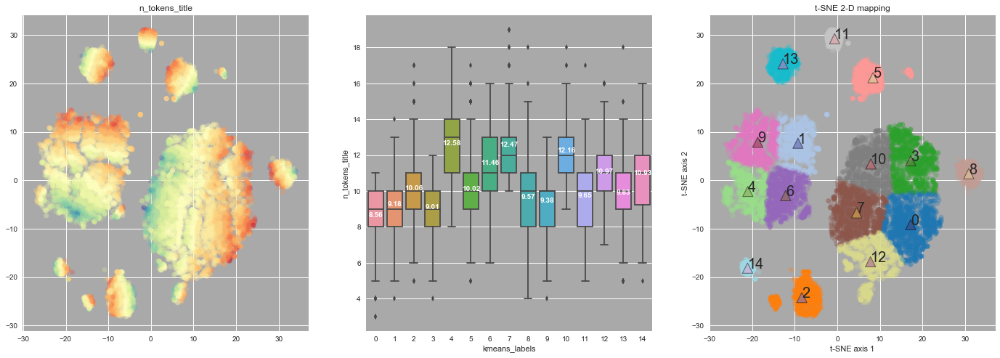

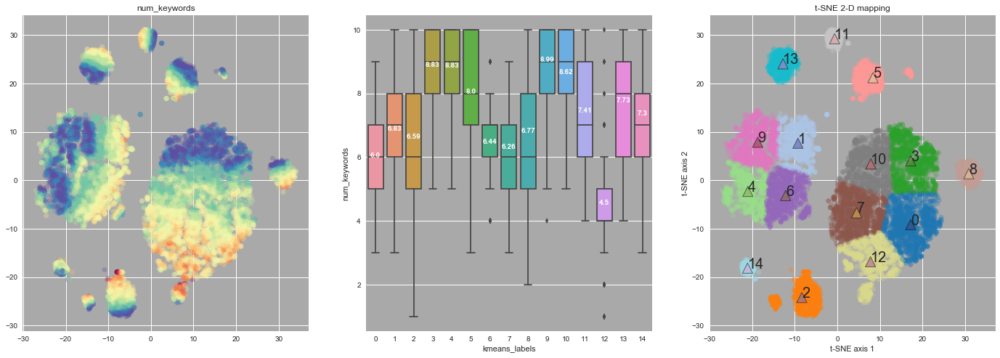

...

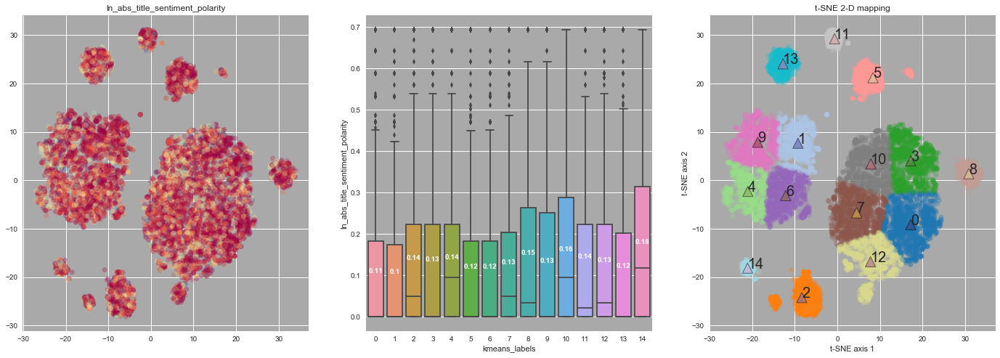

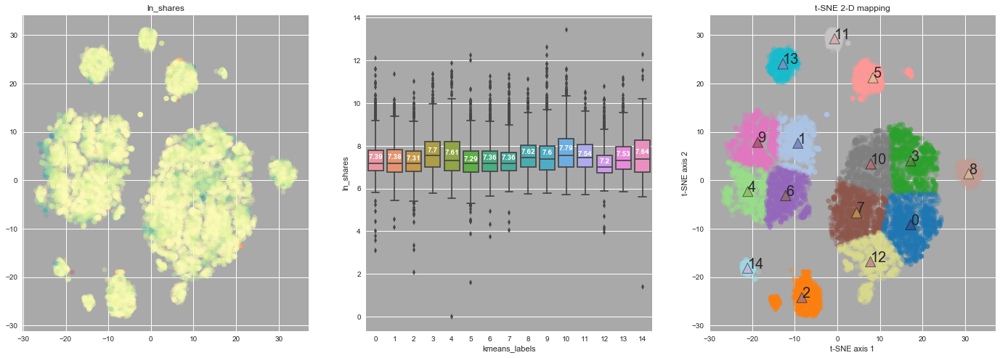

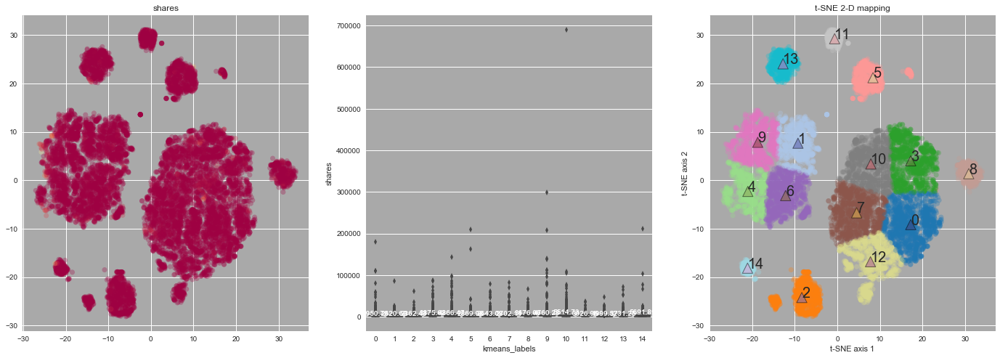

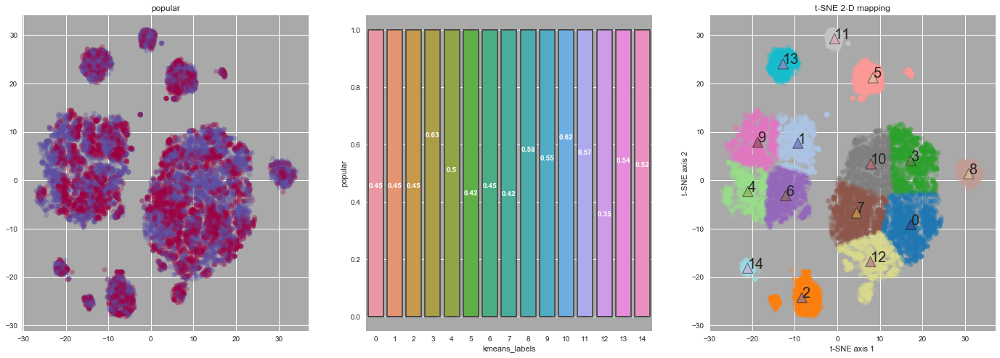

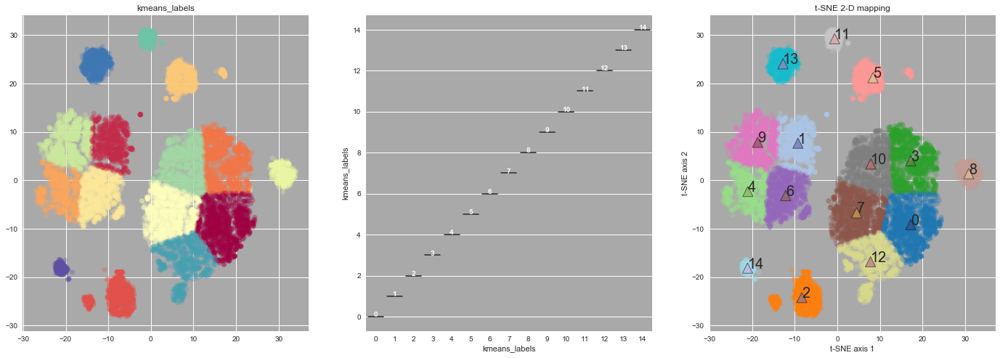

In [62]:
# boxplot across clusters for each feature ...
import seaborn as sns

col_names = X_all_together.columns.values.tolist()

for col in col_names :
    
    _ = plt.figure(figsize=(24, 8));
    
# ... feature distribution color map 

    _ = plt.subplot(131, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = X_all_together[col],
                 cmap = plt.cm.Spectral,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.title(col)
    
# ... feature boxplots

    _ = plt.subplot(132, facecolor = 'darkgrey');
    ax = sns.boxplot(x = "kmeans_labels", y = col, data = X_all_together);
    
    
    average_values = X_all_together.groupby(['kmeans_labels'])[col].mean().values
    average_labels = [str(np.round(s, 2)) for s in average_values]

    pos = range(len(average_values))
    for tick, label in zip(pos, ax.get_xticklabels()):
        
        _ = ax.text(pos[tick], average_values[tick], average_labels[tick], 
                horizontalalignment = 'center', size = 'small', color = 'w', weight = 'semibold')

# ... cluster color map
    
    _ = plt.subplot(133, facecolor = 'darkgrey');
    
    _ = plt.scatter(X_all_together['x-tsne'], X_all_together['y-tsne'],
                 c = kmeans_labels,
                 cmap = plt.cm.tab20,
                 s = 50,
                 linewidths = 0,
                 alpha = 0.30)
    _ = plt.scatter(kmeans_centers[:, 0], kmeans_centers[:, 1],
                c = range(n_lda),
                cmap = plt.cm.tab20b,
                s = 200,
                linewidths = 1.0,
                marker = '^',
                edgecolors = 'black',
                alpha = 0.50);    
    for ii in range(n_lda) :                                       
        _ = plt.text(kmeans_centers[ii, 0], kmeans_centers[ii, 1], ii, fontsize = 20)
        
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    _ = plt.title('t-SNE 2-D mapping')
 
    _ = plt.show();
    

<a href='#toc'> Table of Contents</a>

<a name='end_of_file'></a>
<font color="blue" size=3>  end of file